#### Importing packages

In [496]:
# importing

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import string
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout
from tensorflow.keras.utils import to_categorical
import pandas as pd
from csv import QUOTE_ALL




#### Loading the datasets

In [497]:
import pandas as pd
from csv import QUOTE_ALL
# loading the trump data set
trumpdata = pd.read_csv(
    'US Election 2020 Tweets/hashtag_donaldtrump.csv',
    quoting=QUOTE_ALL,
    encoding='utf-8',
    on_bad_lines='skip',  # Skips problematic rows
    engine='python'  # Use the Python engine for more flexibility
)

# loading the rest of the datasets
bidendata = pd.read_csv('US Election 2020 Tweets/hashtag_joebiden.csv')
trainingdata = pd.read_csv('training data/twitter_sentiment_training_data.csv')

governors_county_candidate_data = pd.read_csv('US Election 2020 Tweets/governors_county_candidate.csv')
governors_county_data = pd.read_csv('US Election 2020 Tweets/governors_county.csv')
governors_state_data = pd.read_csv('US Election 2020 Tweets/governors_state.csv')
house_candidate_data = pd.read_csv('US Election 2020 Tweets/house_candidate.csv')
house_state_data = pd.read_csv('US Election 2020 Tweets/house_state.csv')
president_county_candidate_data = pd.read_csv('US Election 2020 Tweets/president_county_candidate.csv')
president_county_data = pd.read_csv('US Election 2020 Tweets/president_county.csv')
president_state_data = pd.read_csv('US Election 2020 Tweets/president_state.csv')
senate_county_candidate_data = pd.read_csv('US Election 2020 Tweets/senate_county_candidate.csv')
senate_county_data = pd.read_csv('US Election 2020 Tweets/senate_county.csv')
senate_state_data = pd.read_csv('US Election 2020 Tweets/senate_state.csv')



/var/folders/x9/7trw1hcj47vbr9_c1w7dqnvw0000gn/T/ipykernel_45293/1858257467.py:13: DtypeWarning: Columns (1,2,3,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20) have mixed types. Specify dtype option on import or set low_memory=False.
  bidendata = pd.read_csv('US Election 2020 Tweets/hashtag_joebiden.csv')


# Biden Tweet Data

#### Initial Look

One way to get a nice overview of the dataset is to look at the head() as well as info(). We have utilized these to get an intial look of the data.

In [498]:
print('Biden Tweets Data Info:\n')
bidendata.info()

Biden Tweets Data Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1059909 entries, 0 to 1059908
Data columns (total 21 columns):
 #   Column                Non-Null Count    Dtype  
---  ------                --------------    -----  
 0   created_at            1059909 non-null  object 
 1   tweet_id              887173 non-null   object 
 2   tweet                 887173 non-null   object 
 3   likes                 887092 non-null   object 
 4   retweet_count         887073 non-null   float64
 5   source                886360 non-null   object 
 6   user_id               887067 non-null   object 
 7   user_name             887048 non-null   object 
 8   user_screen_name      786660 non-null   object 
 9   user_description      704647 non-null   object 
 10  user_join_date        776784 non-null   object 
 11  user_followers_count  776885 non-null   object 
 12  user_location         543063 non-null   object 
 13  lat                   355284 non-null   object 
 14  long     

In [499]:
print('Biden Tweets Data Head:\n')
bidendata.head()

Biden Tweets Data Head:



,created_at,tweet_id,tweet,likes,retweet_count,source,user_id,user_name,user_screen_name,user_description,...,user_followers_count,user_location,lat,long,city,country,continent,state,state_code,collected_at
0,2020-10-15 00:00:01,1.316529221557252e+18,#Elecciones2020 | En #Florida: #JoeBiden dice ...,0.0,0.0,TweetDeck,360666534.0,El Sol Latino News,elsollatinonews,🌐 Noticias de interés para latinos de la costa...,...,1860.0,"Philadelphia, PA / Miami, FL",25.77427,-80.19366,NaN,United States of America,North America,Florida,FL,2020-10-21 00:00:00
1,2020-10-15 00:00:18,1.31652929585929e+18,#HunterBiden #HunterBidenEmails #JoeBiden #Joe...,0.0,0.0,Twitter for iPad,809904438.0,Cheri A. 🇺🇸,Biloximeemaw,"Locked and loaded Meemaw. Love God, my family ...",...,6628.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-10-21 00:00:00.517827283
2,2020-10-15 00:00:20,1.3165293050069524e+18,@IslandGirlPRV @BradBeauregardJ @MeidasTouch T...,0.0,0.0,Twitter Web App,3494182277.0,Flag Waver,Flag_Wavers,NaN,...,1536.0,Golden Valley Arizona,46.304036,-109.171431,NaN,United States of America,North America,Montana,MT,2020-10-21 00:00:01.035654566
3,2020-10-15 00:00:21,1.3165293080815575e+18,@chrislongview Watching and setting dvr. Let’s...,0.0,0.0,Twitter for iPhone,8.242596012018524e+17,Michelle Ferg,MichelleFerg4,NaN,...,27.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-10-21 00:00:01.553481849
4,2020-10-15 00:00:22,1.316529312741253e+18,#censorship #HunterBiden #Biden #BidenEmails #...,1.0,0.0,Twitter Web App,1.032806955356545e+18,the Gold State,theegoldstate,A Silicon Valley #independent #News #Media #St...,...,390.0,"California, USA",36.701463,-118.755997,NaN,United States of America,North America,California,CA,2020-10-21 00:00:02.071309132


In [500]:
# Drop unnecessary columns
columns_to_drop = ['user_name', 'user_description', 'user_join_date', 'user_location', 'source', 'collected_at']
bidendata.drop(columns=columns_to_drop, inplace=True)

# Verify the remaining columns
print("Remaining columns:\n", bidendata.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1059909 entries, 0 to 1059908
Data columns (total 15 columns):
 #   Column                Non-Null Count    Dtype  
---  ------                --------------    -----  
 0   created_at            1059909 non-null  object 
 1   tweet_id              887173 non-null   object 
 2   tweet                 887173 non-null   object 
 3   likes                 887092 non-null   object 
 4   retweet_count         887073 non-null   float64
 5   user_id               887067 non-null   object 
 6   user_screen_name      786660 non-null   object 
 7   user_followers_count  776885 non-null   object 
 8   lat                   355284 non-null   object 
 9   long                  355284 non-null   object 
 10  city                  186869 non-null   object 
 11  country               353770 non-null   object 
 12  continent             353788 non-null   object 
 13  state                 260191 non-null   object 
 14  state_code            244603 non-n

#### Total Rows and NaN Values

This not only gives us an overview of the amount of rows, but also the amount of missing NaN values. It is also essential look at the percentage of NaN values in the given column as this can help us determine whether we should drop the row or not.

In [501]:
# Total rows in the dataset
# Check the total number of rows in the dataset
total_rows = bidendata.shape[0]
print(f"Total number of rows: {total_rows}\n\n")


print("Total missing values:\n", bidendata.isna().sum().sum(), "\n\n")
print("Missing values in the different features:\n", bidendata.isna().sum())

# Calculate percentage of missing values for each column
missing_percentages = (bidendata.isna().sum() / total_rows) * 100

# Print columns with their missing percentages
print("Percentage of missing values per column:\n", missing_percentages)

Total number of rows: 1059909


Total missing values:
 6729814 


Missing values in the different features:
 created_at                   0
tweet_id                172736
tweet                   172736
likes                   172817
retweet_count           172836
user_id                 172842
user_screen_name        273249
user_followers_count    283024
lat                     704625
long                    704625
city                    873040
country                 706139
continent               706121
state                   799718
state_code              815306
dtype: int64
Percentage of missing values per column:
 created_at               0.000000
tweet_id                16.297248
tweet                   16.297248
likes                   16.304890
retweet_count           16.306683
user_id                 16.307249
user_screen_name        25.780421
user_followers_count    26.702670
lat                     66.479764
long                    66.479764
city                    82.3693

In [502]:
# List of all US states and Washington D.C.
us_states = [
    'Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 'Delaware', 'Florida', 
    'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 
    'Maryland', 'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi', 'Missouri', 'Montana', 'Nebraska', 
    'Nevada', 'New Hampshire', 'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota', 
    'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 
    'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington', 'West Virginia', 'Wisconsin', 'Wyoming', 
    'District of Columbia'
]

# Step 1: Filter rows where 'state' is a US state
bidendata = bidendata[bidendata['state'].isin(us_states)]

# Step 2: Drop rows with NaN values in 'state'
bidendata = bidendata.dropna(subset=['state'])

# Step 3: Define a threshold for grouping smaller states into 'Other'
threshold = 1.1  # States with less than 2% of tweets will be grouped into 'Other'

# Calculate the percentage of tweets for each state
state_percentages = bidendata['state'].value_counts(normalize=True) * 100

# Identify states with less than the threshold percentage
small_states = state_percentages[state_percentages < threshold].index

# Replace small states with 'Other'
bidendata['state'] = bidendata['state'].apply(lambda x: 'Other' if x in small_states else x)

# Recalculate percentages after grouping
grouped_percentages = bidendata['state'].value_counts(normalize=True) * 100

# Verify the cleaned dataset and grouped percentages
print("US states in the dataset after grouping smaller states:\n")
print(grouped_percentages)

# Check the final dataset shape and missing values
print("\nFinal dataset shape:", bidendata.shape)
print("Missing values in the cleaned dataset:\n", bidendata.isna().sum())


US states in the dataset after grouping smaller states:

state
California              16.862732
New York                13.720239
Other                   12.295633
Texas                    9.269408
Florida                  8.676965
District of Columbia     4.608250
Illinois                 3.592541
Pennsylvania             3.529181
Ohio                     2.882524
New Jersey               2.587282
Massachusetts            2.441621
Arizona                  2.121559
Georgia                  2.081061
Michigan                 2.007904
North Carolina           1.994840
Colorado                 1.755119
Oregon                   1.469676
Nevada                   1.458571
Virginia                 1.453999
Washington               1.379536
Maryland                 1.351448
Tennessee                1.301806
Missouri                 1.158104
Name: proportion, dtype: float64

Final dataset shape: (153095, 15)
Missing values in the cleaned dataset:
 created_at                  0
tweet_id         

As seen above, some of the rows have very high percentages of missing values. We have decided to drop the columns with a too high percentage of missing rows, while filling in the missing values for the rest. Specifically for 'State' we have decided to keep it as it is essential to our analysis.

In [503]:
# Dropping high-missing-value columns
high_missing_cols = ['lat', 'long', 'city', 'country', 'continent', 'state_code']
bidendata.drop(columns=high_missing_cols, inplace=True)

# Drop rows with missing critical identifiers
bidendata.dropna(subset=['tweet_id', 'tweet', 'user_id', 'user_screen_name'], inplace=True)

# Fill missing values for critical columns such as the amount of likes and retweets
bidendata['likes'] = pd.to_numeric(bidendata['likes'], errors='coerce').fillna(0).astype(int)
bidendata['retweet_count'] = pd.to_numeric(bidendata['retweet_count'], errors='coerce').fillna(0).astype(int)

# Handle 'user_followers_count' by filling missing values with 0
bidendata['user_followers_count'] = pd.to_numeric(bidendata['user_followers_count'], errors='coerce').fillna(0).astype(int)

# Verifying the amount of NaN values
print("Total missing values:\n", bidendata.isna().sum().sum(), "\n\n")
print("Missing values in the different features:\n", bidendata.isna().sum())

# Final dataset shape
print(f"Cleaned dataset shape: {bidendata.shape}")
print(f"Total number of rows: {total_rows}\n\n")


Total missing values:
 0 


Missing values in the different features:
 created_at              0
tweet_id                0
tweet                   0
likes                   0
retweet_count           0
user_id                 0
user_screen_name        0
user_followers_count    0
state                   0
dtype: int64
Cleaned dataset shape: (153095, 9)
Total number of rows: 1059909




# Trump Tweets

### Again, doing the same thing for the Trump data

#### Initial Look

In [504]:
print('Trump Tweets Data Info:\n')
trumpdata.info()

Trump Tweets Data Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 971087 entries, 0 to 971086
Data columns (total 21 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   created_at            971087 non-null  object 
 1   tweet_id              971073 non-null  object 
 2   tweet                 971073 non-null  object 
 3   likes                 971045 non-null  object 
 4   retweet_count         970933 non-null  float64
 5   source                970057 non-null  object 
 6   user_id               970929 non-null  object 
 7   user_name             970911 non-null  object 
 8   user_screen_name      970933 non-null  object 
 9   user_description      869661 non-null  object 
 10  user_join_date        970779 non-null  object 
 11  user_followers_count  970917 non-null  object 
 12  user_location         675830 non-null  object 
 13  lat                   445702 non-null  object 
 14  long                  44570

In [505]:
print('\nTrump Tweets Data Head:\n')
trumpdata.head()


Trump Tweets Data Head:



,created_at,tweet_id,tweet,likes,retweet_count,source,user_id,user_name,user_screen_name,user_description,...,user_followers_count,user_location,lat,long,city,country,continent,state,state_code,collected_at
0,2020-10-15 00:00:01,1.316529221557252e+18,#Elecciones2020 | En #Florida: #JoeBiden dice ...,0.0,0.0,TweetDeck,360666534.0,El Sol Latino News,elsollatinonews,🌐 Noticias de interés para latinos de la costa...,...,1860.0,"Philadelphia, PA / Miami, FL",25.77427,-80.19366,NaN,United States of America,North America,Florida,FL,2020-10-21 00:00:00
1,2020-10-15 00:00:01,1.3165292227484303e+18,"Usa 2020, Trump contro Facebook e Twitter: cop...",26.0,9.0,Social Mediaset,331617619.0,Tgcom24,MediasetTgcom24,Profilo ufficiale di Tgcom24: tutte le notizie...,...,1067661.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-10-21 00:00:00.373216530
2,2020-10-15 00:00:02,1.316529228091847e+18,"#Trump: As a student I used to hear for years,...",2.0,1.0,Twitter Web App,8436472.0,snarke,snarke,"Will mock for food! Freelance writer, blogger,...",...,1185.0,Portland,45.5202471,-122.6741949,Portland,United States of America,North America,Oregon,OR,2020-10-21 00:00:00.746433060
3,2020-10-15 00:00:02,1.316529227471237e+18,2 hours since last tweet from #Trump! Maybe he...,0.0,0.0,Trumpytweeter,8.28355589206057e+17,Trumpytweeter,trumpytweeter,"If he doesn't tweet for some time, should we b...",...,32.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-10-21 00:00:01.119649591
4,2020-10-15 00:00:08,1.3165292523014513e+18,You get a tie! And you get a tie! #Trump ‘s ra...,4.0,3.0,Twitter for iPhone,47413798.0,Rana Abtar - رنا أبتر,Ranaabtar,"Washington Correspondent, Lebanese-American ,c...",...,5393.0,Washington DC,38.8949924,-77.0365581,Washington,United States of America,North America,District of Columbia,DC,2020-10-21 00:00:01.492866121


#### Cleaning Trump Data

It is important that we have the same columns as the biden data when doing our data analysis

In [506]:
# Drop unnecessary columns (same as Biden data)
columns_to_drop = ['user_name', 'user_description', 'user_join_date', 'user_location', 'source', 'collected_at', 
                   'lat', 'long', 'city', 'country', 'continent', 'state_code']
trumpdata.drop(columns=columns_to_drop, inplace=True)

In [507]:
# List of all US states and Washington D.C.
us_states = [
    'Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 'Delaware', 'Florida', 
    'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 
    'Maryland', 'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi', 'Missouri', 'Montana', 'Nebraska', 
    'Nevada', 'New Hampshire', 'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota', 
    'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 
    'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington', 'West Virginia', 'Wisconsin', 'Wyoming', 
    'District of Columbia'
]

# Step 1: Filter rows where 'state' is a US state
trumpdata = trumpdata[trumpdata['state'].isin(us_states)]

# Step 2: Drop rows with NaN values in 'state'
trumpdata = trumpdata.dropna(subset=['state'])

# Step 3: Define a threshold for grouping smaller states into 'Other'
threshold = 1.1  # States with less than 2% of tweets will be grouped into 'Other'

# Calculate the percentage of tweets for each state
state_percentages = trumpdata['state'].value_counts(normalize=True) * 100

# Identify states with less than the threshold percentage
small_states = state_percentages[state_percentages < threshold].index

# Replace small states with 'Other'
trumpdata['state'] = trumpdata['state'].apply(lambda x: 'Other' if x in small_states else x)

# Recalculate percentages after grouping
grouped_percentages = trumpdata['state'].value_counts(normalize=True) * 100

# Verify the cleaned dataset and grouped percentages
print("US states in the dataset after grouping smaller states:\n")
print(grouped_percentages)

# Check the final dataset shape and missing values
print("\nFinal dataset shape:", trumpdata.shape)
print("Missing values in the cleaned dataset:\n", trumpdata.isna().sum())


US states in the dataset after grouping smaller states:

state
California              17.461795
New York                12.827254
Other                   11.688661
Florida                  9.287580
Texas                    9.244974
District of Columbia     5.428921
Pennsylvania             3.930417
Illinois                 3.799235
New Jersey               2.828264
Massachusetts            2.645506
Ohio                     2.170111
Colorado                 2.028277
North Carolina           1.914474
Oregon                   1.752458
Michigan                 1.711534
Georgia                  1.612306
Arizona                  1.606140
Washington               1.546715
Virginia                 1.395351
Nevada                   1.338730
Missouri                 1.291078
Tennessee                1.263048
Maryland                 1.227169
Name: proportion, dtype: float64

Final dataset shape: (178378, 9)
Missing values in the cleaned dataset:
 created_at              0
tweet_id              

In [508]:
# Verify the remaining columns
print("\nRemaining columns after dropping unnecessary ones:")
trumpdata.info()


Remaining columns after dropping unnecessary ones:
<class 'pandas.core.frame.DataFrame'>
Index: 178378 entries, 0 to 971073
Data columns (total 9 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   created_at            178378 non-null  object 
 1   tweet_id              178378 non-null  object 
 2   tweet                 178378 non-null  object 
 3   likes                 178378 non-null  object 
 4   retweet_count         178378 non-null  float64
 5   user_id               178378 non-null  object 
 6   user_screen_name      178378 non-null  object 
 7   user_followers_count  178378 non-null  object 
 8   state                 178378 non-null  object 
dtypes: float64(1), object(8)
memory usage: 13.6+ MB


In [509]:
# Total rows in the dataset
total_rows = trumpdata.shape[0]
print(f"\nTotal number of rows: {total_rows}\n")

# Total missing values in the dataset
print("Total missing values:\n", trumpdata.isna().sum().sum(), "\n")

# Missing values in each column
print("Missing values in the different features:\n", trumpdata.isna().sum())

# Calculate percentage of missing values for each column
missing_percentages = (trumpdata.isna().sum() / total_rows) * 100

# Print columns with their missing percentages
print("\nPercentage of missing values per column:\n", missing_percentages)


Total number of rows: 178378

Total missing values:
 0 

Missing values in the different features:
 created_at              0
tweet_id                0
tweet                   0
likes                   0
retweet_count           0
user_id                 0
user_screen_name        0
user_followers_count    0
state                   0
dtype: int64

Percentage of missing values per column:
 created_at              0.0
tweet_id                0.0
tweet                   0.0
likes                   0.0
retweet_count           0.0
user_id                 0.0
user_screen_name        0.0
user_followers_count    0.0
state                   0.0
dtype: float64


In [510]:
bidendata.info()


<class 'pandas.core.frame.DataFrame'>
Index: 153095 entries, 0 to 1059895
Data columns (total 9 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   created_at            153095 non-null  object
 1   tweet_id              153095 non-null  object
 2   tweet                 153095 non-null  object
 3   likes                 153095 non-null  int64 
 4   retweet_count         153095 non-null  int64 
 5   user_id               153095 non-null  object
 6   user_screen_name      153095 non-null  object
 7   user_followers_count  153095 non-null  int64 
 8   state                 153095 non-null  object
dtypes: int64(3), object(6)
memory usage: 11.7+ MB


#### Data Visualization

In [511]:
# Get top 10 most liked tweets for Biden dataset
top_liked_biden = bidendata.nlargest(10, 'likes')[['tweet', 'likes']]

# Get top 10 most liked tweets for Trump dataset
top_liked_trump = trumpdata.nlargest(10, 'likes')[['tweet', 'likes']]

# Display the results
print("Top 10 Most Liked Tweets - Biden Hashtag:")
print(top_liked_biden)

print("\nTop 10 Most Liked Tweets - Trump Hashtag:")
print(top_liked_trump)

TypeError: Column 'likes' has dtype object, cannot use method 'nlargest' with this dtype

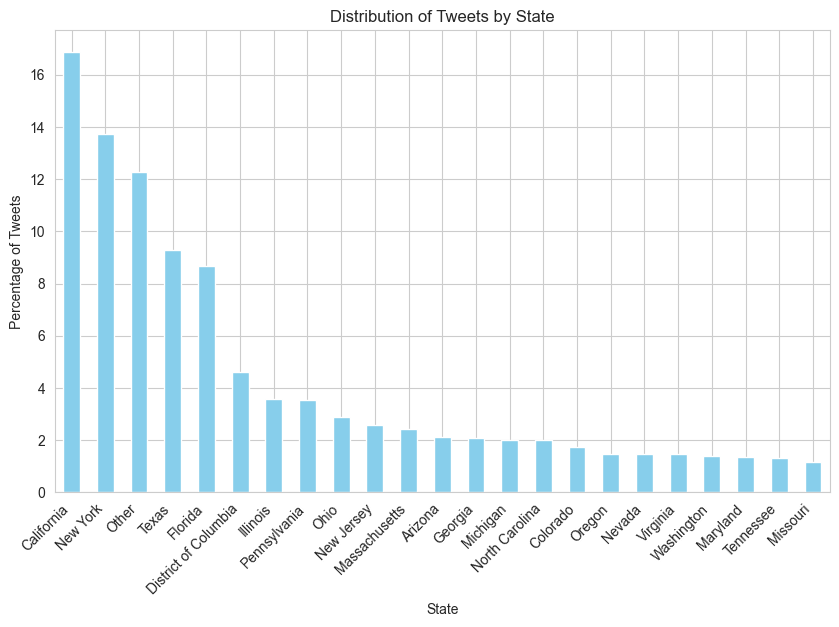

In [ ]:
import matplotlib.pyplot as plt

# Calculate the distribution of tweets by state
state_distribution = bidendata['state'].value_counts(normalize=True) * 100

# Bar chart
plt.figure(figsize=(10, 6))
state_distribution.plot(kind='bar', color='skyblue')
plt.title('Distribution of Tweets by State')
plt.xlabel('State')
plt.ylabel('Percentage of Tweets')
plt.xticks(rotation=45, ha='right')
plt.show()


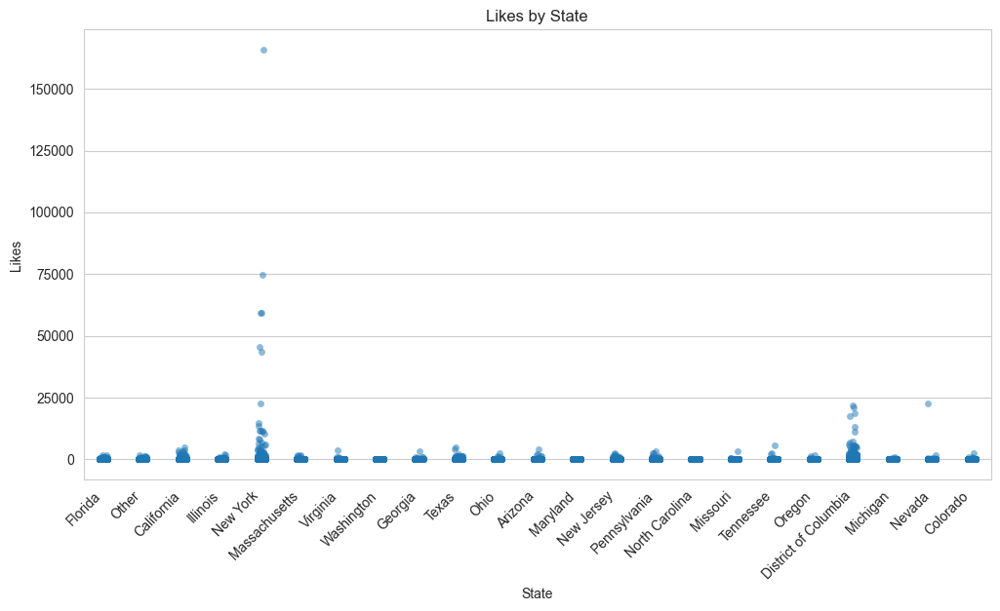

In [ ]:
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.stripplot(x='state', y='likes', data=bidendata, jitter=True, alpha=0.5)
plt.title('Likes by State')
plt.xlabel('State')
plt.ylabel('Likes')
plt.xticks(rotation=45, ha='right')
plt.show()


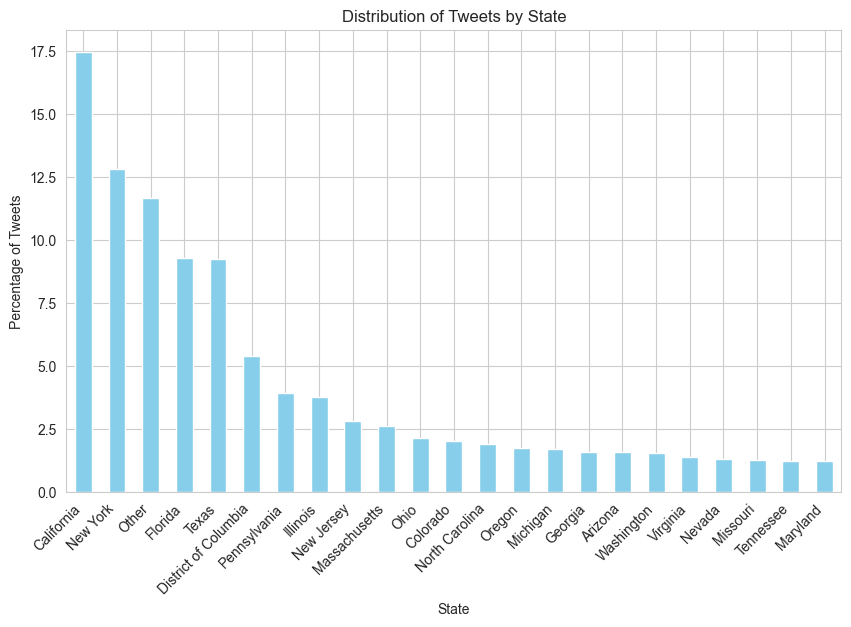

In [ ]:
import matplotlib.pyplot as plt

# Calculate the distribution of tweets by state
state_distribution = trumpdata['state'].value_counts(normalize=True) * 100

# Bar chart
plt.figure(figsize=(10, 6))
state_distribution.plot(kind='bar', color='skyblue')
plt.title('Distribution of Tweets by State')
plt.xlabel('State')
plt.ylabel('Percentage of Tweets')
plt.xticks(rotation=45, ha='right')
plt.show()


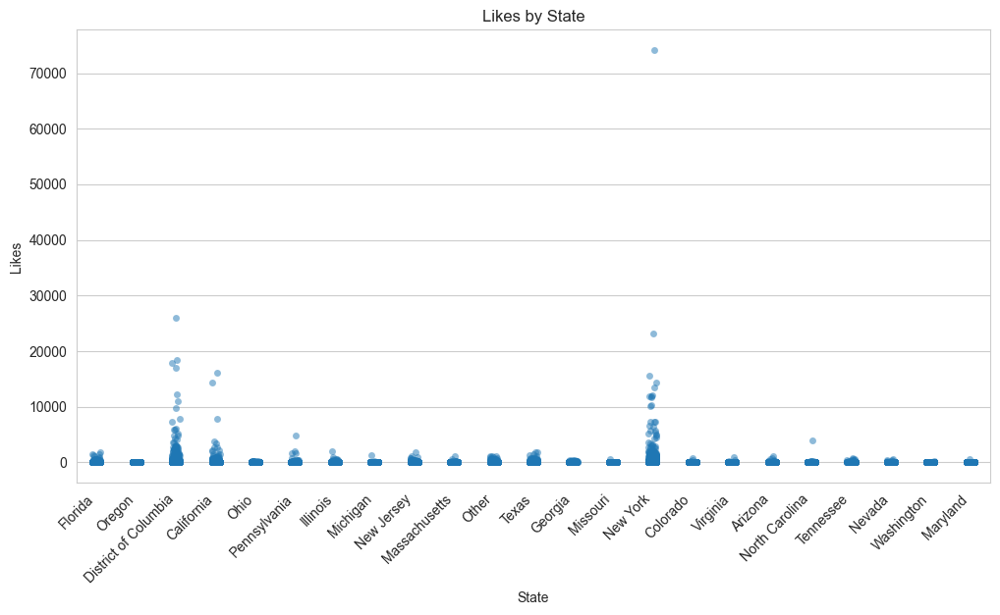

In [ ]:
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.stripplot(x='state', y='likes', data=trumpdata, jitter=True, alpha=0.5)
plt.title('Likes by State')
plt.xlabel('State')
plt.ylabel('Likes')
plt.xticks(rotation=45, ha='right')
plt.show()


As seen above, the data for 'State' is quite similar for the two datasets.

In [ ]:
# Cleaning

# remove missing values
trainingdata = trainingdata.dropna()

# change sentiment to 0, 1, 2
trainingdata['category'] = trainingdata['category'].replace(1, 2)
trainingdata['category'] = trainingdata['category'].replace(0, 1)
trainingdata['category'] = trainingdata['category'].replace(-1, 0)

## remvoing non-string rows
bidendata = bidendata[bidendata['tweet'].apply(lambda x: isinstance(x, str))]
trumpdata = trumpdata[trumpdata['tweet'].apply(lambda x: isinstance(x, str))]
trainingdata = trainingdata[trainingdata['clean_text'].apply(lambda x: isinstance(x, str))]

In [ ]:
# training data categories should have the same amount of tweets
def sample_min_group_size(group):
    return group.sample(trainingdata['category'].value_counts().min()).reset_index(drop=True)

trainingdata = trainingdata.groupby('category').apply(sample_min_group_size)

/var/folders/x9/7trw1hcj47vbr9_c1w7dqnvw0000gn/T/ipykernel_45293/1185353498.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  trainingdata = trainingdata.groupby('category').apply(sample_min_group_size)


In [512]:
# how many are left
print('Biden:', len(bidendata))
print('Trump:', len(trumpdata))

Biden: 153095
Trump: 178378


In [515]:
# preprocessing the training data
def preprocess(text):
    text = text.lower()
    text = text.translate(str.maketrans('', '', string.punctuation))
    text = text.strip()
    return text

bidendata['tweet'] = bidendata['tweet'].apply(preprocess)
trumpdata['tweet'] = trumpdata['tweet'].apply(preprocess)
trainingdata['clean_text'] = trainingdata['clean_text'].apply(preprocess)

# Training the clasifier

In [516]:
# Parameters
max_words = 10000 
max_len = 100   

# Tokenizer
tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(trainingdata['clean_text'])

# Tokenize and pad sequences
sequences = tokenizer.texts_to_sequences(trainingdata['clean_text'])
X = pad_sequences(sequences, maxlen=max_len, padding='post')

# One-hot encode labels for multi-class classification
y = to_categorical(trainingdata['category'], num_classes=3)  # 3 classes (-1, 0, 1)


/opt/anaconda3/envs/data-mining-course/lib/python3.12/site-packages/pandas/core/series.py:1031: RuntimeWarning: invalid value encountered in cast
  arr = np.asarray(values, dtype=dtype)


In [517]:
# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Check the shapes
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")


X_train shape: (130384, 100), y_train shape: (130384, 3)
X_test shape: (32596, 100), y_test shape: (32596, 3)


In [518]:
# Define the model
model = Sequential([
    Embedding(input_dim=max_words, output_dim=128, input_length=max_len),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5), 
    Dense(3, activation='softmax')  # Output layer for 3 classes (0, 1, 2)
])

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])



/opt/anaconda3/envs/data-mining-course/lib/python3.12/site-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


In [519]:
# Train the model
history = model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=3,
    batch_size=16
)

Epoch 1/3
6520/6520 ━━━━━━━━━━━━━━━━━━━━ 35s 5ms/step - accuracy: 0.7453 - loss: 0.6050 - val_accuracy: 0.9279 - val_loss: 0.2360
Epoch 2/3
6520/6520 ━━━━━━━━━━━━━━━━━━━━ 33s 5ms/step - accuracy: 0.9404 - loss: 0.1994 - val_accuracy: 0.9340 - val_loss: 0.2214
Epoch 3/3
6520/6520 ━━━━━━━━━━━━━━━━━━━━ 33s 5ms/step - accuracy: 0.9625 - loss: 0.1208 - val_accuracy: 0.9340 - val_loss: 0.2733


In [520]:
# the 6 categories
positive_trump = []
negative_trump = []
neutral_trump = []

positive_biden = []
negative_biden = []
neutral_biden = []

In [521]:
# processing the biden and trump text
def preprocess_tweets(texts, max_len=100):
    # Convert texts to sequences
    sequences = tokenizer.texts_to_sequences(texts)
    # Pad sequences
    padded_sequences = pad_sequences(sequences, maxlen=max_len, padding='post')
    return padded_sequences



preprocessed_tweets_trump = preprocess_tweets(trumpdata['tweet'])
preprocessed_tweets_biden = preprocess_tweets(bidendata['tweet'])

In [522]:
# Predict probabilities
trump_predictions = model.predict(preprocessed_tweets_trump)
biden_predictions = model.predict(preprocessed_tweets_biden)

# Convert probabilities to class labels
predicted_classes_trump = trump_predictions.argmax(axis=-1)
predicted_classes_biden = biden_predictions.argmax(axis=-1)

# Map numeric classes to sentiment labels
class_mapping = {0: "Negative", 1: "Neutral", 2: "Positive"}
predicted_labels_trump = [class_mapping[label] for label in predicted_classes_trump]
predicted_labels_biden = [class_mapping[label] for label in predicted_classes_biden]

# Print the results
# trump tweets
for i, label in enumerate(predicted_labels_trump):
    row = trumpdata.iloc[i].to_dict()
    if label == 'Positive':
        positive_trump.append(row)
    elif label == 'Negative':
        negative_trump.append(row)
    elif label == 'Neutral':
        neutral_trump.append(row)

# biden tweets
for i, label in enumerate(predicted_labels_biden):
    row = bidendata.iloc[i].to_dict()
    if label == 'Positive':
        positive_biden.append(row)
    elif label == 'Negative':
        negative_biden.append(row)
    elif label == 'Neutral':
        neutral_biden.append(row)

5575/5575 ━━━━━━━━━━━━━━━━━━━━ 5s 958us/step
4785/4785 ━━━━━━━━━━━━━━━━━━━━ 4s 826us/step


Trump
Positive: 20.790119857830003 %
Negative: 42.292210922871654 %
Neutral: 36.91766921929835 %
Biden
Positive: 15.677193899212908 %
Negative: 46.0224043894314 %
Neutral: 38.30040171135569 %


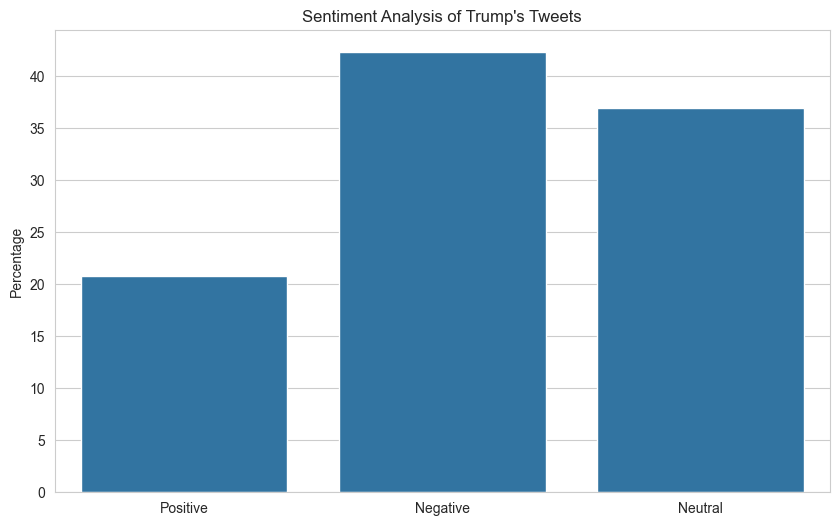

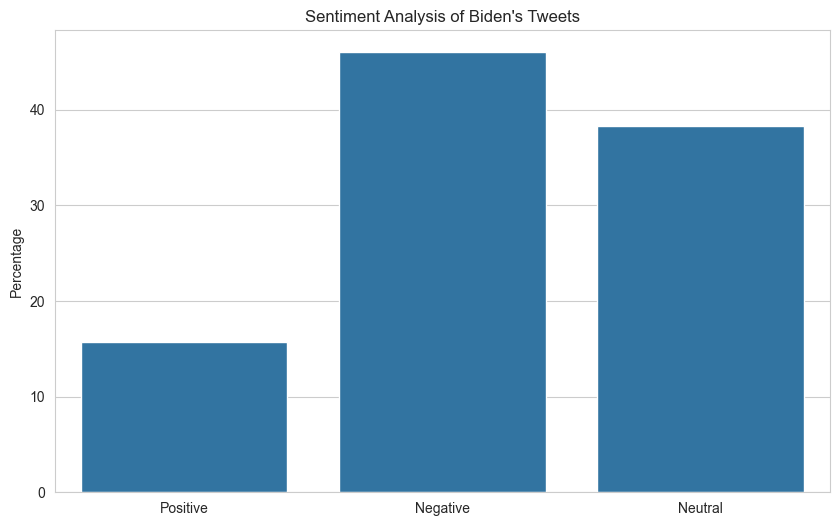

In [523]:
# demo show the results in percentage
count_positive_trump = len(positive_trump) / len(trumpdata) * 100
count_negative_trump = len(negative_trump) / len(trumpdata) * 100
count_neutral_trump = len(neutral_trump) / len(trumpdata) * 100

count_positive_biden = len(positive_biden) / len(bidendata) * 100
count_negative_biden = len(negative_biden) / len(bidendata) * 100
count_neutral_biden = len(neutral_biden) / len(bidendata) * 100

print('Trump')
print('Positive:', count_positive_trump, '%')
print('Negative:', count_negative_trump, '%')
print('Neutral:', count_neutral_trump, '%')

print('Biden')
print('Positive:', count_positive_biden, '%')
print('Negative:', count_negative_biden, '%')
print('Neutral:', count_neutral_biden, '%')

# Plot the results using 
sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))
sns.barplot(x=['Positive', 'Negative', 'Neutral'], y=[count_positive_trump, count_negative_trump, count_neutral_trump])
plt.title("Sentiment Analysis of Trump's Tweets")
plt.ylabel("Percentage")
plt.show()

plt.figure(figsize=(10, 6))
sns.barplot(x=['Positive', 'Negative', 'Neutral'], y=[count_positive_biden, count_negative_biden, count_neutral_biden])
plt.title("Sentiment Analysis of Biden's Tweets")
plt.ylabel("Percentage")
plt.show()


In [524]:
# demo: show negative biden tweets
for tweet_data in negative_biden:
    if isinstance(tweet_data, dict):
        print(tweet_data['tweet'])
        print('state:', tweet_data['state'])
        print('---')

elecciones2020  en florida joebiden dice que donaldtrump solo se preocupa por él mismo el demócrata fue anfitrión de encuentros de electores en pembrokepines y miramar clic aquí ⬇️⬇️⬇️
⠀
🌐httpstcoqhiwpiuxst

elsollatino yobrilloconelsol httpstco6flcbwf1mi
state: Florida
---
islandgirlprv bradbeauregardj meidastouch this is how biden made his  trumpisnotamerica 
httpstcoubqafu86ip
state: Other
---
censorship hunterbiden biden bidenemails bidenemail corruption httpstcoc6clrtshql
state: California
---
in an effort to find the truth about allegations that twitter isnt allowing people to share the link to a nypost article about hunter biden this is what popped up nypost hunterbiden biden election2020 httpstcoyyimdzrokz
state: Illinois
---
realjameswoods bidencrimefamily joebiden hunterbiden hunterbidenemails httpstcoottx1yp37j
state: California
---
vote for joebiden httpstcoiirool5u0o
state: Florida
---
trump is tearing up biden at the trumprally over the hunterbidenemails
state: California

Classification Report:
               precision    recall  f1-score   support

       Trump       0.58      0.35      0.43     16820
       Biden       0.77      0.90      0.83     41540

    accuracy                           0.74     58360
   macro avg       0.67      0.62      0.63     58360
weighted avg       0.72      0.74      0.72     58360



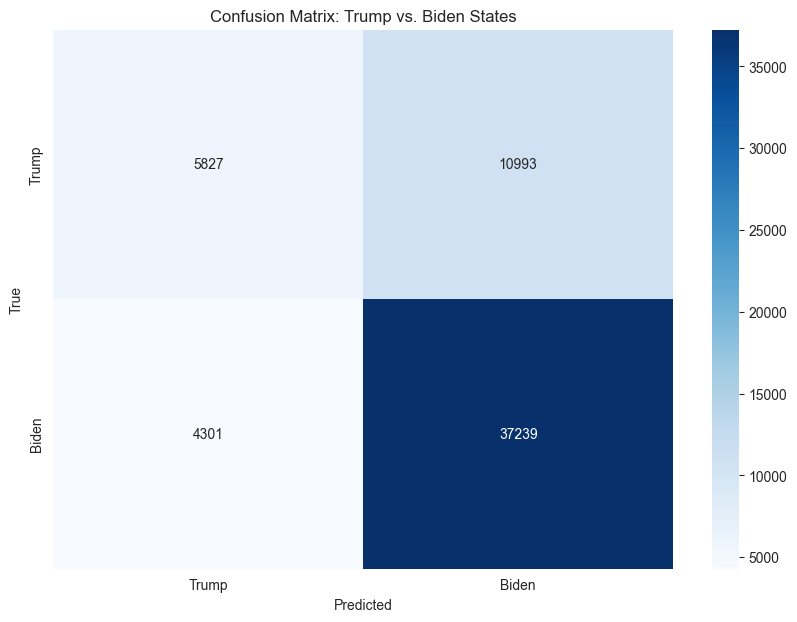

In [525]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Add a column for candidate
trumpdata['candidate'] = 'Trump'
bidendata['candidate'] = 'Biden'

# Step 2: Combine the datasets
combined_data = pd.concat([trumpdata, bidendata], ignore_index=True)

# Step 3: Define 2020 election results for all states in the dataset
election_2020_results = {
    'California': 1, 'New York': 1, 'Florida': 0, 'Texas': 0, 'District of Columbia': 1,
    'Pennsylvania': 1, 'Illinois': 1, 'New Jersey': 1, 'Massachusetts': 1, 'Ohio': 0,
    'Colorado': 1, 'North Carolina': 0, 'Oregon': 1, 'Michigan': 1, 'Georgia': 1,
    'Arizona': 1, 'Washington': 1, 'Virginia': 1, 'Nevada': 1, 'Missouri': 0,
    'Tennessee': 0, 'Maryland': 1, 'Minnesota': 1
}

# Step 4: Filter for states in the dataset and assign their labels
combined_data = combined_data[combined_data['state'].isin(election_2020_results.keys())].reset_index(drop=True)
combined_data['voted_for'] = combined_data['state'].map(election_2020_results)

# Step 5: Ensure predictions align with combined_data
# Filter predictions based on candidate
trump_predictions_aligned = trump_predictions[:len(trumpdata)]
biden_predictions_aligned = biden_predictions[:len(bidendata)]

# Create a list to hold aligned predictions
aligned_predictions = []

# Iterate over combined_data to assign the correct predictions
for idx, row in combined_data.iterrows():
    if row['candidate'] == 'Trump':
        aligned_predictions.append(trump_predictions_aligned[idx])
    elif row['candidate'] == 'Biden':
        aligned_predictions.append(biden_predictions_aligned[idx - len(trumpdata)])  # Adjust index for Biden predictions

# Convert probabilities to class labels
filtered_predicted_classes = [pred.argmax() for pred in aligned_predictions]

# Step 6: Encode Sentiment (Include Neutral)
sentiment_mapping = {0: 'Negative', 1: 'Neutral', 2: 'Positive'}
combined_data['sentiment_score'] = [sentiment_mapping[label] for label in filtered_predicted_classes]

# Keep all sentiment classes
combined_data['sentiment_score'] = combined_data['sentiment_score'].map({'Negative': 0, 'Neutral': 1, 'Positive': 2})

# Step 7: Prepare Features and Target
X = combined_data[['sentiment_score', 'likes', 'retweet_count', 'user_followers_count']]
y = combined_data['voted_for']

# Step 8: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 9: Train the Random Forest Classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Step 10: Evaluate the Model
y_pred = clf.predict(X_test)
print("Classification Report:\n", classification_report(y_test, y_pred, target_names=['Trump', 'Biden']))

# Step 11: Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt="d", xticklabels=['Trump', 'Biden'], yticklabels=['Trump', 'Biden'], cmap="Blues")
plt.title("Confusion Matrix: Trump vs. Biden States")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()


In [495]:
total_trump_tweets = trumpdata.shape[0]
print(f"Total number of tweets in the Trump dataset: {total_trump_tweets}")

Total number of tweets in the Trump dataset: 178378
